# Spatial Reasoning with Point Clouds


In [ ]:
!pip install open3d pypotree --quiet

In [ ]:
import os
import cv2
import math
import torch
# import pypotree
import numpy as np
import open3d as o3d
from matplotlib import pyplot as plt

ModuleNotFoundError: No module named 'pypotree'

## Starting from a single RGB image
Select a collection of images with CLIP-Retrieval: https://github.com/rom1504/clip-retrieval

Metric Depth from ZoeDepth: https://huggingface.co/spaces/shariqfarooq/ZoeDepth


In [ ]:
!wget https://remyx.ai/assets/spatialvlm/warehouse_rgb.jpg
!wget https://remyx.ai/assets/spatialvlm/warehouse_depth.png

--2024-02-12 21:46:53--  https://remyx.ai/assets/spatialvlm/warehouse_rgb.jpg
Resolving remyx.ai (remyx.ai)... 18.160.200.3, 18.160.200.118, 18.160.200.129, ...
Connecting to remyx.ai (remyx.ai)|18.160.200.3|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 91604 (89K) [image/jpeg]
Saving to: ‘warehouse_rgb.jpg’

warehouse_rgb.jpg   100%[===================>]  89.46K  --.-KB/s    in 0.08s   

2024-02-12 21:46:53 (1.03 MB/s) - ‘warehouse_rgb.jpg’ saved [91604/91604]

--2024-02-12 21:46:53--  https://remyx.ai/assets/spatialvlm/warehouse_depth.png
Resolving remyx.ai (remyx.ai)... 18.160.200.3, 18.160.200.118, 18.160.200.129, ...
Connecting to remyx.ai (remyx.ai)|18.160.200.3|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 79721 (78K) [image/png]
Saving to: ‘warehouse_depth.png’

warehouse_depth.png 100%[===================>]  77.85K  --.-KB/s    in 0.08s   

2024-02-12 21:46:53 (944 KB/s) - ‘warehouse_depth.png’ saved [79721/79721]



In [ ]:
rgb_path = "/content/warehouse_rgb.jpg"
depth_path = "/content/warehouse_depth.png"
img = cv2.imread(rgb_path)
height, width, _ = img.shape

## Estimate Camera Parameters

Use CLIP to filter images where you can estimate FOV

**SpatialVLM** https://arxiv.org/pdf/2401.12168.pdf

In [ ]:
intrinsic_parameters = {
    'width': width,
    'height': height,
    'fx': 1.5 * width,
    'fy': 1.5 * width,
    'cx': width / 2,
    'cy': height / 2,
}

In [ ]:
def create_point_cloud_from_rgbd(rgb_image, depth_image, intrinsic_parameters):
    rgbd_image = o3d.geometry.RGBDImage.create_from_color_and_depth(
        o3d.io.read_image(rgb_image),
        o3d.io.read_image(depth_image),
        depth_scale=1000.0,
        depth_trunc=10.0,
        convert_rgb_to_intensity=False
    )
    intrinsic = o3d.camera.PinholeCameraIntrinsic()
    intrinsic.set_intrinsics(intrinsic_parameters['width'], intrinsic_parameters['height'],
                             intrinsic_parameters['fx'], intrinsic_parameters['fy'],
                             intrinsic_parameters['cx'], intrinsic_parameters['cy'])
    pcd = o3d.geometry.PointCloud.create_from_rgbd_image(rgbd_image, intrinsic)
    return pcd

## Plane Segmentation and Coordinate Transform

Segment planes with RANSAC and change coordinates
so that the Z-axis is normal to the floor or table tops.

In [ ]:
def canonicalize_point_cloud(pcd, canonicalize_threshold=0.3):
    # Segment the largest plane, assumed to be the floor
    plane_model, inliers = pcd.segment_plane(distance_threshold=0.01, ransac_n=3, num_iterations=1000)

    canonicalized = False
    if len(inliers) / len(pcd.points) > canonicalize_threshold:
        canonicalized = True

        # Ensure the plane normal points upwards
        if np.dot(plane_model[:3], [0, 1, 0]) < 0:
            plane_model = -plane_model

        # Normalize the plane normal vector
        normal = plane_model[:3] / np.linalg.norm(plane_model[:3])

        # Compute the new basis vectors
        new_y = normal
        new_x = np.cross(new_y, [0, 0, -1])
        new_x /= np.linalg.norm(new_x)
        new_z = np.cross(new_x, new_y)

        # Create the transformation matrix
        transformation = np.identity(4)
        transformation[:3, :3] = np.vstack((new_x, new_y, new_z)).T
        transformation[:3, 3] = -np.dot(transformation[:3, :3], pcd.points[inliers[0]])

        # Apply the transformation
        pcd.transform(transformation)

        # Additional 180-degree rotation around the Z-axis
        rotation_z_180 = np.array([[np.cos(np.pi), -np.sin(np.pi), 0],
                                   [np.sin(np.pi), np.cos(np.pi), 0],
                                   [0, 0, 1]])
        pcd.rotate(rotation_z_180, center=(0, 0, 0))

        return pcd, canonicalized, transformation
    else:
        return pcd, canonicalized, None

## Pypotree to Visualize Open3D Point Clouds in Colab

In [ ]:
pcd = create_point_cloud_from_rgbd(rgb_path, depth_path, intrinsic_parameters)
pcd_canonicalized, canonicalized, transformation = canonicalize_point_cloud(pcd)
cloud = np.asarray(pcd_canonicalized.points)
cloudpath = pypotree.generate_cloud_for_display(cloud)
pypotree.display_cloud_colab(cloudpath)

/usr/local/lib/python3.10/dist-packages/bin/PotreeConverter .tmp.txt -f xyz -o point_clouds -p 2c5f81 --material ELEVATION --edl-enabled --overwrite
https://localhost:39475/point_clouds/pointclouds/2c5f81


## CLIPSeg for Open Vocabulary Concept Localization

Use LLaVA for Image Captioning to enumerate objects in the scene
https://huggingface.co/spaces/liuhaotian/LLaVA-1.6

::ffff:127.0.0.1 - - [12/Feb/2024 21:18:52] "GET /point_clouds/libs/openlayers3/ol.css HTTP/1.1" 200 -
::ffff:127.0.0.1 - - [12/Feb/2024 21:18:52] "GET /point_clouds/libs/potree/potree.css HTTP/1.1" 200 -
::ffff:127.0.0.1 - - [12/Feb/2024 21:18:52] "GET /point_clouds/libs/jquery-ui/jquery-ui.min.css HTTP/1.1" 200 -
::ffff:127.0.0.1 - - [12/Feb/2024 21:18:52] "GET /point_clouds/libs/jquery/jquery-3.1.1.min.js HTTP/1.1" 200 -
::ffff:127.0.0.1 - - [12/Feb/2024 21:18:52] "GET /point_clouds/libs/jstree/themes/mixed/style.css HTTP/1.1" 200 -
::ffff:127.0.0.1 - - [12/Feb/2024 21:18:52] "GET /point_clouds/libs/perfect-scrollbar/css/perfect-scrollbar.css HTTP/1.1" 200 -
::ffff:127.0.0.1 - - [12/Feb/2024 21:18:52] "GET /point_clouds/libs/spectrum/spectrum.css HTTP/1.1" 200 -
::ffff:127.0.0.1 - - [12/Feb/2024 21:18:52] "GET /point_clouds/libs/spectrum/spectrum.js HTTP/1.1" 200 -
::ffff:127.0.0.1 - - [12/Feb/2024 21:18:53] "GET /point_clouds/libs/perfect-scrollbar/js/perfect-scrollbar.jquery.js HT

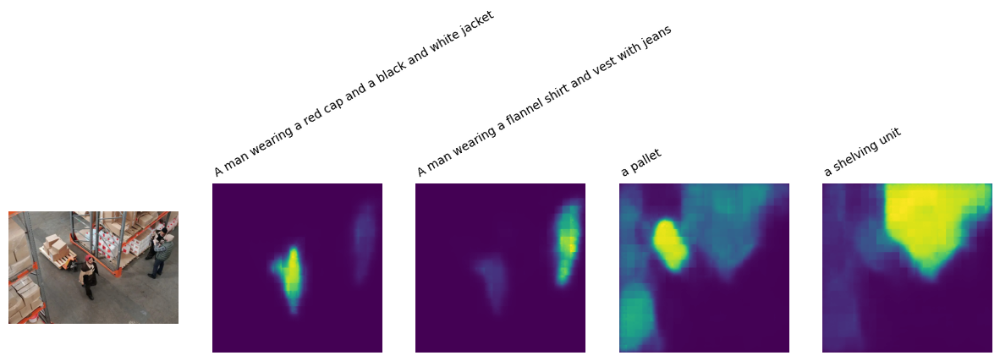

In [ ]:
from transformers import AutoProcessor, CLIPSegForImageSegmentation

device = "cuda" if torch.cuda.is_available() else "cpu"

processor = AutoProcessor.from_pretrained("CIDAS/clipseg-rd64-refined")
model = CLIPSegForImageSegmentation.from_pretrained("CIDAS/clipseg-rd64-refined")

text_descriptions = [
    "A man wearing a red cap and a black and white jacket",
    "A man wearing a flannel shirt and vest with jeans",
    "a pallet",
    "a shelving unit",
]

image = Image.open(rgb_path)
inputs = processor(text=text_descriptions, images=[image] * len(text_descriptions), padding=True, return_tensors="pt")
outputs = model(**inputs)
logits = outputs.logits
preds = logits.detach().unsqueeze(1)

_, ax = plt.subplots(1, len(text_descriptions) + 1, figsize=(3*(len(text_descriptions) + 1), 4))
[a.axis('off') for a in ax.flatten()]
ax[0].imshow(image)
[ax[i+1].imshow(torch.sigmoid(preds[i][0])) for i in range(len(text_descriptions))];
[ax[i+1].text(0, -15, prompt, rotation=30) for i, prompt in enumerate(text_descriptions)];

## Sampling Points from CLIPSeg to Prompt SAM

Threshold probabilities to sample points before filtering for medoids biases the selected points toward the peak of the distribution.

In [ ]:
def find_medoid_and_closest_points(points, num_closest=5):
    """
    Find the medoid from a collection of points and the closest points to the medoid.

    Parameters:
    points (np.array): A numpy array of shape (N, D) where N is the number of points and D is the dimensionality.
    num_closest (int): Number of closest points to return.

    Returns:
    np.array: The medoid point.
    np.array: The closest points to the medoid.
    """
    distances = np.sqrt(((points[:, np.newaxis, :] - points[np.newaxis, :, :]) ** 2).sum(axis=-1))
    distance_sums = distances.sum(axis=1)
    medoid_idx = np.argmin(distance_sums)
    medoid = points[medoid_idx]
    sorted_indices = np.argsort(distances[medoid_idx])
    closest_indices = sorted_indices[1:num_closest + 1]
    return medoid, points[closest_indices]

def sample_points_from_heatmap(heatmap, original_size, num_points=5, percentile=0.95):
    """
    Sample points from the given heatmap, focusing on areas with higher values.
    """
    threshold = np.percentile(heatmap.numpy(), percentile)
    masked_heatmap = torch.where(heatmap > threshold, heatmap, torch.tensor(0.0))
    probabilities = torch.softmax(masked_heatmap.flatten(), dim=0)

    attn = torch.sigmoid(heatmap)
    w = attn.shape[0]
    sampled_indices = torch.multinomial(torch.tensor(probabilities.ravel()), num_points, replacement=True)

    sampled_coords = np.array(np.unravel_index(sampled_indices, attn.shape)).T
    medoid, sampled_coords = find_medoid_and_closest_points(sampled_coords)
    pts = []
    for pt in sampled_coords.tolist():
        x, y = pt
        x = height * x / w
        y = width * y / w
        pts.append([y, x])
    return pts

sampled_points = []
original_size = img.shape[:2][::-1]
for idx in range(preds.shape[0]):
    sampled_points.append(sample_points_from_heatmap(preds[idx][0], original_size, num_points=10))

from transformers import SamModel, SamProcessor

sam_model = SamModel.from_pretrained("facebook/sam-vit-huge").to("cuda" if torch.cuda.is_available() else "cpu")
sam_processor = SamProcessor.from_pretrained("facebook/sam-vit-huge")

sam_masks = []
for idx in range(preds.shape[0]):
  sam_inputs = sam_processor(image, input_points=[sampled_points[idx]], return_tensors="pt").to(device)

  with torch.no_grad():
      sam_outputs = sam_model(**sam_inputs)

  sam_masks.append(sam_processor.image_processor.post_process_masks(
      sam_outputs.pred_masks.cpu(), sam_inputs["original_sizes"].cpu(), sam_inputs["reshaped_input_sizes"].cpu()
  ))

<ipython-input-51-cfddfd7d5b16>:31: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  sampled_indices = torch.multinomial(torch.tensor(probabilities.ravel()), num_points, replacement=True)
::ffff:127.0.0.1 - - [12/Feb/2024 21:19:19] "GET /point_clouds/pointclouds/2c5f81/data/r/r5.bin HTTP/1.1" 200 -
::ffff:127.0.0.1 - - [12/Feb/2024 21:19:19] "GET /point_clouds/pointclouds/2c5f81/data/r/r1.bin HTTP/1.1" 200 -
::ffff:127.0.0.1 - - [12/Feb/2024 21:19:19] "GET /point_clouds/pointclouds/2c5f81/data/r/r05.bin HTTP/1.1" 200 -
::ffff:127.0.0.1 - - [12/Feb/2024 21:19:19] "GET /point_clouds/pointclouds/2c5f81/data/r/r4.bin HTTP/1.1" 200 -
::ffff:127.0.0.1 - - [12/Feb/2024 21:19:23] "GET /point_clouds/pointclouds/2c5f81/data/r/r15.bin HTTP/1.1" 200 -
::ffff:127.0.0.1 - - [12/Feb/2024 21:19:23] "GET /point_clouds/pointclouds/2c5f81/data/r/r14.bin HTTP

## Visualizing the Selected Points to Prompt SAM

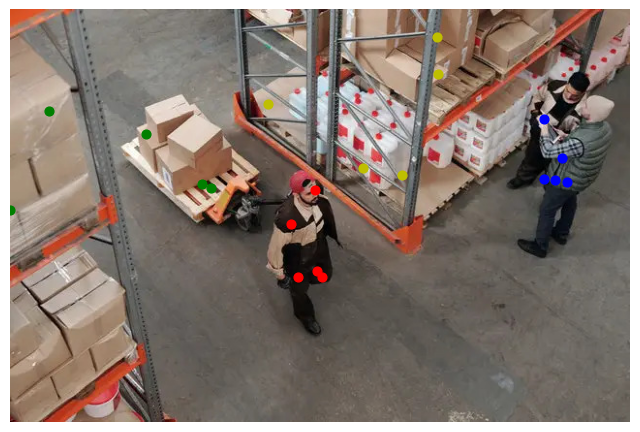

In [ ]:
plt.figure(figsize=(8, 8))
plt.imshow(image)
plt.axis('off')

colors = ['r', 'b', 'g', 'y']
for j in range(len(sampled_points)):
  for x, y in sampled_points[j]:
      plt.scatter(x, y, color=colors[j], s=40)

plt.show()

## Visualizing the SAM Segmentation Masks for Each Concept

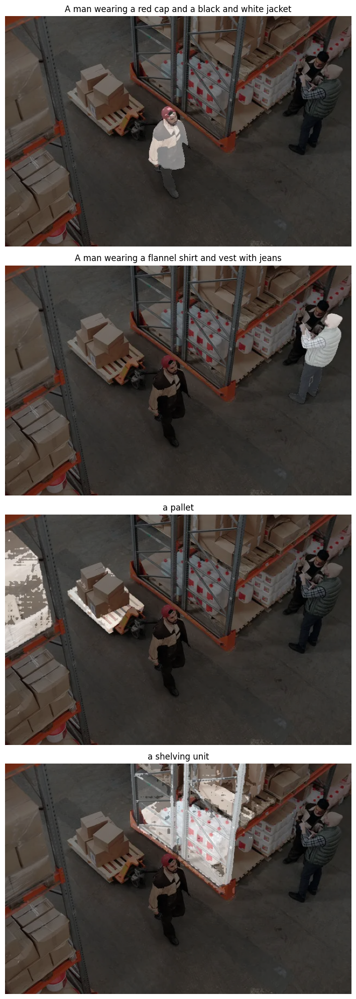

In [ ]:
num_masks = len(sam_masks)

plt.figure(figsize=(15, num_masks * 5))

for i, mask in enumerate(sam_masks):
    plt.subplot(num_masks, 1, i + 1)
    plt.imshow(image)
    plt.imshow(cv2.cvtColor(255 * mask[0].numpy().squeeze().transpose((1, 2, 0)).astype(np.uint8), cv2.COLOR_BGR2GRAY), cmap='gray', alpha=0.5)
    plt.title(f'{text_descriptions[i]}')
    plt.axis('off')

plt.tight_layout()
plt.show()

In [ ]:

def apply_mask_to_image(image, mask):
    """
    Apply a binary mask to an image. The mask should be a binary array where the regions to keep are True.
    """
    masked_image = image.copy()
    for c in range(masked_image.shape[2]):
        masked_image[:, :, c] = masked_image[:, :, c] * mask
    return masked_image

depth = cv2.cvtColor(cv2.imread(depth_path, cv2.IMREAD_UNCHANGED), cv2.COLOR_GRAY2BGR)
point_clouds = []
for i, mask_tensor in enumerate(sam_masks):
    mask = cv2.cvtColor(255 * mask_tensor[0].numpy().squeeze().transpose((1, 2, 0)).astype(np.uint8), cv2.COLOR_BGR2GRAY)
    mask_binary = mask > 0

    masked_rgb = apply_mask_to_image(img, mask_binary)
    masked_depth = apply_mask_to_image(depth, mask_binary)

    masked_rgb_path = f'temp_masked_rgb_{i}.png'
    masked_depth_path = f'temp_masked_depth_{i}.png'
    cv2.imwrite(masked_rgb_path, masked_rgb)
    cv2.imwrite(masked_depth_path, masked_depth)

    pcd = create_point_cloud_from_rgbd(masked_rgb_path, masked_depth_path, intrinsic_parameters)
    point_clouds.append(pcd)

    os.remove(masked_rgb_path)
    os.remove(masked_depth_path)

for idx, pcd in enumerate(point_clouds):
    cl, ind = pcd.remove_statistical_outlier(nb_neighbors=20, std_ratio=2.0)
    inlier_cloud = pcd.select_by_index(ind)
    point_clouds[idx] = inlier_cloud

## Visualize the Segmented Point Cloud

In [ ]:
combined_pcd = o3d.geometry.PointCloud()
plane_model, inliers = pcd.segment_plane(distance_threshold=0.01, ransac_n=3, num_iterations=1000)
inlier_cloud = pcd.select_by_index(inliers)
combined_pcd += inlier_cloud

for pcd in point_clouds:
    combined_pcd += pcd

pcd_components, canonicalized, transformation = canonicalize_point_cloud(combined_pcd)

cloud = np.asarray(pcd_components.points)
cloudpath = pypotree.generate_cloud_for_display(cloud)
pypotree.display_cloud_colab(cloudpath)

/usr/local/lib/python3.10/dist-packages/bin/PotreeConverter .tmp.txt -f xyz -o point_clouds -p 7cd297 --material ELEVATION --edl-enabled --overwrite
https://localhost:39475/point_clouds/pointclouds/7cd297


## Compute Height with Axis-Aligned Bounding Boxes

In [ ]:
def get_bounding_box_height(pcd):
    """
    Compute the height of the bounding box for a given point cloud.

    Parameters:
    pcd (open3d.geometry.PointCloud): The input point cloud.

    Returns:
    float: The height of the bounding box.
    """
    aabb = pcd.get_axis_aligned_bounding_box()
    return aabb.get_extent()[1]  # Assuming the Y-axis is the up-direction

def compare_bounding_box_height(pcd_i, pcd_j):
    """
    Compare the bounding box heights of two point clouds.

    Parameters:
    pcd_i (open3d.geometry.PointCloud): The first point cloud.
    pcd_j (open3d.geometry.PointCloud): The second point cloud.

    Returns:
    bool: True if the bounding box of pcd_i is taller than that of pcd_j, False otherwise.
    """
    height_i = get_bounding_box_height(pcd_i)
    height_j = get_bounding_box_height(pcd_j)

    return height_i > height_j

# Example usage:
# Assuming 'point_clouds' is your list of Open3D point cloud objects
# And you want to compare the box of point cloud at index i with the box of point cloud at index j
i = 0
j = 2
is_taller = compare_bounding_box_height(point_clouds[i], point_clouds[j])

print(f"Bounding box of '{text_descriptions[i]}' is {'taller' if is_taller else 'not taller'} than bounding box of '{text_descriptions[j]}'.")


Bounding box of 'A man wearing a red cap and a black and white jacket' is taller than bounding box of 'a pallet'.


## Now we can synthesize responses using predicates that have trouble with certain perspectives.